In [ ]:
import sys
print(sys.executable)
print(sys.version)

In [ ]:
#!pip install mpld3


In [1]:
import glob

import numpy as np
import scipy as sp
import scipy.io
import scipy.signal

import matplotlib.pyplot as plt
%matplotlib inline

import mpld3
mpld3.enable_notebook()

In [2]:
def LoadTroikaDataset():
    """
    Retrieve the .mat filenames for the troika dataset.

    Review the README in ./datasets/troika/ to understand the organization of the .mat files.

    Returns:
        data_fls: Names of the .mat files that contain signal data
        ref_fls: Names of the .mat files that contain reference data
        <data_fls> and <ref_fls> are ordered correspondingly, so that ref_fls[5] is the 
            reference data for data_fls[5], etc...
    """
    data_dir = "./datasets/troika/training_data"
    data_fls = sorted(glob.glob(data_dir + "/DATA_*.mat"))
    ref_fls = sorted(glob.glob(data_dir + "/REF_*.mat"))
    return data_fls, ref_fls

In [3]:
def LoadTroikaDataFile(data_fl):
    """
    Loads and extracts signals from a troika data file.

    Usage:
        data_fls, ref_fls = LoadTroikaDataset()
        ppg, accx, accy, accz = LoadTroikaDataFile(data_fls[0])

    Args:
        data_fl: (str) filepath to a troika .mat file.

    Returns:
        numpy arrays for ppg, accx, accy, accz signals.
    """
    data = sp.io.loadmat(data_fl)['sig']
    return data[2:]

In [4]:
# Load the Troika dataset
data_fls, ref_fls = LoadTroikaDataset()
print('FLS Dataset: ', data_fls)
print('')
print('REFERENCE Dataset: ', ref_fls)



FLS Dataset:  ['./datasets/troika/training_data\\DATA_01_TYPE01.mat', './datasets/troika/training_data\\DATA_02_TYPE02.mat', './datasets/troika/training_data\\DATA_03_TYPE02.mat', './datasets/troika/training_data\\DATA_04_TYPE01.mat', './datasets/troika/training_data\\DATA_04_TYPE02.mat', './datasets/troika/training_data\\DATA_05_TYPE02.mat', './datasets/troika/training_data\\DATA_06_TYPE02.mat', './datasets/troika/training_data\\DATA_07_TYPE02.mat', './datasets/troika/training_data\\DATA_08_TYPE02.mat', './datasets/troika/training_data\\DATA_10_TYPE02.mat', './datasets/troika/training_data\\DATA_11_TYPE02.mat', './datasets/troika/training_data\\DATA_12_TYPE02.mat']

REFERENCE Dataset:  ['./datasets/troika/training_data\\REF_01_TYPE01.mat', './datasets/troika/training_data\\REF_02_TYPE02.mat', './datasets/troika/training_data\\REF_03_TYPE02.mat', './datasets/troika/training_data\\REF_04_TYPE01.mat', './datasets/troika/training_data\\REF_04_TYPE02.mat', './datasets/troika/training_data\

In [5]:
# load the data files into the variables ppg, accx, accy and accz (x,y,z acc channels)
ppg, accx, accy, accz = LoadTroikaDataFile(data_fls[0])


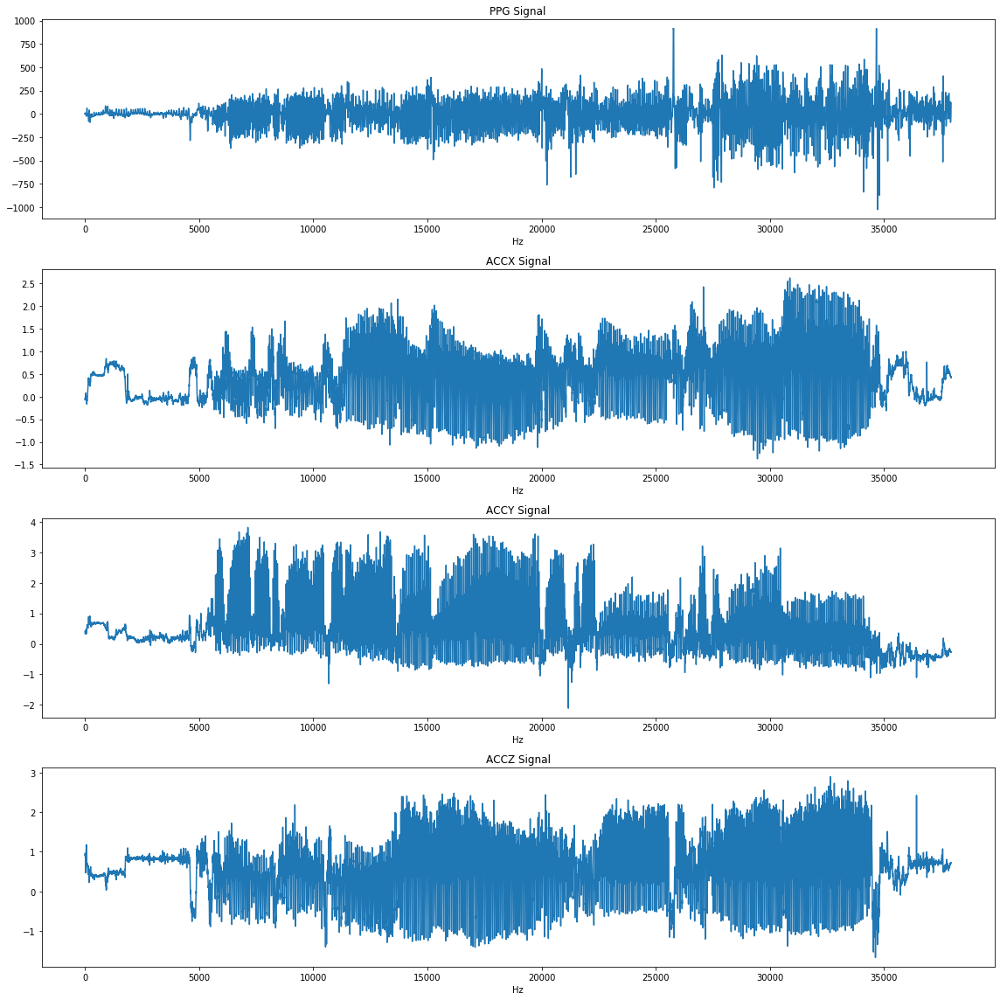

In [6]:
# print the ppg, accx, accy and accz grapghs in seperate plots
plt.subplots(4, figsize=(16,16))
plt.subplot(4,1,1)
plt.plot(ppg)
plt.title('PPG Signal')
plt.xlabel("Hz")

plt.subplot(4,1,2)
plt.plot(accx)
plt.title('ACCX Signal')
plt.xlabel("Hz")

plt.subplot(4,1,3)
plt.plot(accy)
plt.title('ACCY Signal')
plt.xlabel("Hz")

plt.subplot(4,1,4)
plt.plot(accz)
plt.title('ACCZ Signal')
plt.xlabel("Hz")

plt.tight_layout()

In [10]:
# load reference or ground truth data from 
ref_bpm = sp.io.loadmat(ref_fls[0])['BPM0']

In [12]:
def BandpassFilter(signal,  fs=125):
    """Bandpass Filter.
    
    Args:
        signal: (np.array) The input signal
        pass_band: (tuple) The pass band. Frequency components outside 
            the two elements in the tuple will be removed. 
        fs: (number) The sampling rate of <signal>
        
    Returns:
        (np.array) The filtered signal
    """
    bandpass = (40/60, 240/60)  #/60 per minute
    b, a = sp.signal.butter(3, bandpass, btype='bandpass', fs=fs)
    
    return sp.signal.filtfilt(b, a, signal)

In [103]:
# run the ppg through a band pass filter using butter
ppg_bandpass = BandpassFilter(ppg, fs=125)
accx_bandpass = BandpassFilter(accx,  fs=125)
accy_bandpass = BandpassFilter(accy,  fs=125)
accz_bandpass = BandpassFilter(accz,  fs=125)

# calculate the total combined accelorometer based on the band pass filter
acc_bandpass = np.sqrt(np.square(accx) + np.square(accy) + np.square(accz))


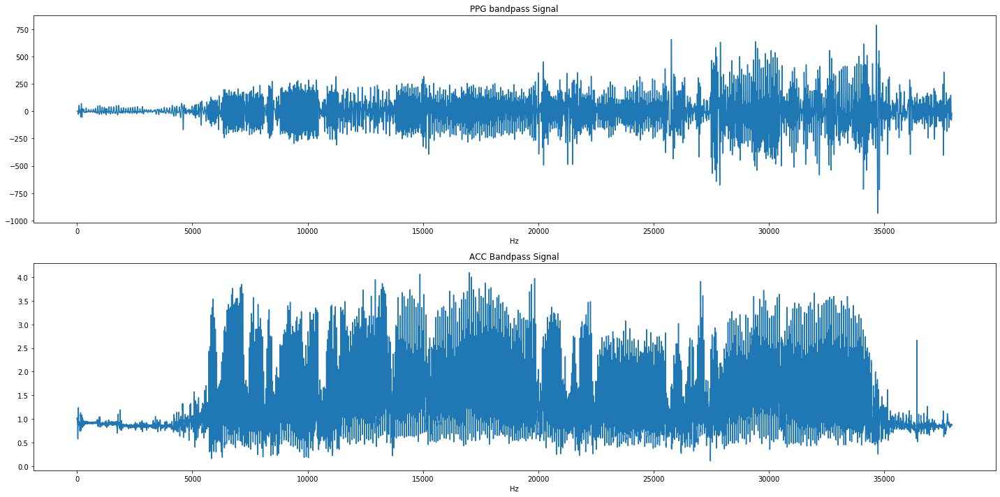

In [20]:
plt.subplots(2, figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(ppg_bandpass, )
plt.title('PPG bandpass Signal')
plt.xlabel("Hz")

plt.subplot(2,1,2)
plt.plot(acc_bandpass)
plt.title('ACC Bandpass Signal')
plt.xlabel("Hz")

plt.tight_layout()


In [132]:

# 1. code of estimate BMP and confidence
for i in range (0, len(ppg_bandpass) - 1000, 250):
    ppg_window = ppg_bandpass[i:i + 1000]
    acc_window = ppg_bandpass[i:i + 1000]

    ppg_frequencies, ppg_fft = FourierTransform(ppg_window,fs=125)
    acc_frequencies, acc_fft = FourierTransform(acc_window,fs=125)
    #DEL === ppg_peaks = FindPeaks(ppg_fft, height=1, distance=1, fs=125)[0]
    
    ppg_peaks = FindPeaks(ppg_fft, fs=125)[0]
    acc_peaks = FindPeaks(acc_fft, fs=125)[0]

    ppg_estimate, ppg_confidence = ComputeEstimates(ppg_frequencies,ppg_fft,ppg_peaks)
    acc_estimate, acc_confidence = ComputeEstimates(acc_frequencies,acc_fft,acc_peaks)
    
    
        


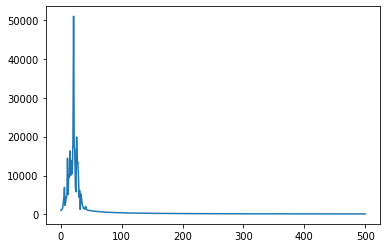

In [25]:
def FourierTransform(signal, fs=125):
    """Fourier Transform.
       
    Args:
        signal: (np.array) The input signal
        window_length: (number) the FFT block lenght 
        overlap: (number) the overlap number 
        fs: (number) The sampling rate of the signal

    returns:
        (complex ndarray) Frequency (freqs) and magnitude (fft_mags) of the signal running 
        the method Fast Fourier Transform    
    """
    freqs = np.fft.rfftfreq(len(signal), 1 / fs)
    fft_mags = np.abs(np.fft.rfft(signal))
    return freqs, fft_mags

In [130]:
def FindPeaks(signal, fs=125):
    """ FindPeaks
    Args:
        signal: (np.array) The input signal
        height: (number) the Y axis treshold    
        distance: (number) the distance between the peaks
        fs: (number) The sampling rate of the signal
    returns:

    """
    #DEL === peaks = sp.signal.find_peaks(signal,height,distance,fs)
    #DEL === height = 20 % of max
    peaks = sp.signal.find_peaks(signal,height=np.max(signal)*0.2)

    return peaks


In [131]:
def ComputeEstimates(freqs, fft, peaks):
    confidence = []
    estimates = []
    
    estimates = freqs[peaks]
    for i in range(len(peaks)):
        peak_minus_10_ms = freqs[int(peaks[i] - 10)]
        peak_plus_10_ms = freqs[int(peaks[i] + 10)]
        
        #DEL === fft_peak = fft[(freqs >= peak_minus_10_ms) & (freqs <= peak_plus_10_ms)]
        peak_confidence = np.sum(fft[(freqs >= peak_minus_10_ms) & (freqs <= pk_plus_10_ms)] / np.sum(fft))

        confidence.append(pk_confidence)

    return estimates, confidence
    


In [ ]:
# fourier transform the ppg signal
ppg_bandpass_window = ppg_bandpass[0:8*125]
ppg_freqs, ppg_fft = FourierTransform(ppg_bandpass_window,fs=125) 

# fourier transform the acc signal
acc_bandpass_window = acc_bandpass[0:8*125]
acc_freqs, acc_fft = FourierTransform(acc_bandpass_window,fs=125) 


#plt.plot(np.fft.rfftfreq(len(sig), 1/fs), np.abs(np.fft.rfft(sig)))

In [ ]:
plt.subplots(2, figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(ppg_freqs, np.abs(ppg_fft))
plt.title('PPG Fourier')
plt.xlabel("Hz")

plt.subplot(2,1,2)
plt.plot(acc_freqs, np.abs(acc_fft))
plt.title('ACC Fourier')
plt.xlabel("Hz")

plt.tight_layout()

In [ ]:
# filter the fourier transform data
ppg_fft[ppg_freqs <= 40/60] = 0.0
ppg_fft[ppg_freqs >= 240/60] = 0.0

acc_fft[acc_freqs <= 40/60] = 0.0
acc_fft[acc_freqs >= 240/60] = 0.0


In [ ]:
plt.plot(ppg_freqs, np.abs(ppg_fft))

In [ ]:
plt.subplots(2, figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(ppg_freqs, np.abs(ppg_fft))
plt.title('Filtered PPG Fourier')
plt.xlabel("Hz")

plt.subplot(2,1,2)
plt.plot(acc_freqs, np.abs(acc_fft))
plt.title('Filtered ACC Fourier')
plt.xlabel("Hz")

plt.tight_layout()

In [ ]:
# Find Peaks
ppg_peaks = sp.signal.find_peaks(ppg_fft)[0]
#ppg_peaks = ppg_freqs[ppg_peaks]

acc_peaks = sp.signal.find_peaks(acc_fft)[0]
#acc_peaks = acc_freqs[acc_peaks]



#ppg_peaks = sp.signal.find_peaks(ppg_fft, height=2000, distance=10)[0]
#plt.plot(ppg_fft)
#plt.plot(ppg_peaks, ppg_fft[ppg_peaks], 'r.')

In [ ]:
#plot_fft(ppg_bandpass[0:8*125], ppg_freqs, ppg_fft, 125)

plt.subplots(2, figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(ppg_fft)
plt.plot(ppg_peaks, ppg_fft[ppg_peaks], 'r.')
plt.title('Filtered PPG Fourier')
plt.xlabel("Hz")

plt.subplot(2,1,2)
plt.plot(np.abs(acc_fft))
plt.plot(acc_peaks, acc_fft[acc_peaks], 'r.')
plt.title('Filtered ACC Fourier')
plt.xlabel("Hz")

plt.tight_layout()

In [ ]:
errors = [] 
conf = []

fundamental_frequency_window.append = (ppg_freqs >= hr_f - window_f) & (ppg_freqs <= hr_f + window_f)
    #conf.append(np.sum(ppg_fft[i][confidence_window]) / np.sum(ppg_fft[i]))



In [ ]:
# Get the MAX PPG and ACC freq
ppg_max_freq = ppg_freqs[np.argmax(ppg_fft)]
acc_max_freq = acc_freqs[np.argmax(acc_fft)]

In [ ]:


frequency = np.abs(acc_max_freq -  ppg_max_freq)
ppg_max = ppg_freqs[np.argsort(ppg_fft, axis=0)[-1]]
est_bmp = ppg_max * 60

In [ ]:
# calculate the confidence
# SNR Function
## Convert hr_bpm to Hz
hr_f = est_bmp / 60

## calulate the frequency of the first harmonic
harmonic_f = hr_f * 2

# 5 BPM in Hz
window_f = 5 / 60          



In [ ]:
## Find the frequencies around the heart rate 
conf = []

fundamental_frequency_window = (ppg_freqs >= hr_f - window_f) & (ppg_freqs <= hr_f + window_f)
harmonic_frequency_window = (ppg_freqs > harmonic_f - window_f) & (ppg_freqs < harmonic_f + window_f) 

# Compute signal power and noise power
signal_power = np.sum(ppg_fft[(fundamental_frequency_window) | (harmonic_frequency_window)])

noise_power = np.sum(ppg_fft[~((fundamental_frequency_window) | (harmonic_frequency_window))])

# Compute SNR
snr = signal_power / noise_power


conf.append(np.sum(ppg_fft[confidence_window]) / np.sum(ppg_fft))

In [ ]:
def Fourier_Spectrum(signal, NFFT, noverlap, fs=125):
    """ Fourier_Spectrum
        calculates frequency spectrum by providing a Signal
        where noise is removed (using pass band).
    Args:
        signal:     (np.array) The input filtered signal (use pass band)
        NFFT:       (number) the FFT block lenght 
        noverlap:   (number) the overlap number
        fs:         (number) The sampling rate of the signal
    return:
        freqs: (np.array) list of freq calculated by the NFFT and fs
        freq_spectrum: (np.array) list of FFT results
    
    """
    wind_minus_overlap = (NFFT * fs) - (noverlap * fs)
    number_of_data_blocks = (len(signal) - (NFFT * fs)) // wind_minus_overlap + 1 

    freq_spectrum = []
    for i in range(number_of_data_blocks):
        window = signal[i * wind_minus_overlap:i * wind_minus_overlap+(NFFT * fs)].copy()
        fft_mags = np.abs(np.fft.rfft(window))
        freq_spectrum.append(fft_mags)

    freqs = np.fft.rfftfreq((NFFT * fs), 1 / fs)
    freq_spectrum = np.stack(freq_spectrum, axis=1)
    
    return  freqs, freq_spectrum




In [ ]:
# run the bandpass_filter on the:
    #       - ppg and the three channels of the accelerometer
ppg_bandpass = BandpassFilter(ppg, fs=125)
accx = BandpassFilter(accx, fs=125)
accy = BandpassFilter(accy, fs=125)
accz = BandpassFilter(accz, fs=125)

In [ ]:
# calculate the total accelorometer based on the band pass filter
acc_bandpass = np.sqrt(np.square(accx) + np.square(accy) + np.square(accz))


In [ ]:
# from Here

In [ ]:
wind_minus_overlap = (8 * 125) - (6 * 125)
number_of_data_blocks = (len(ppg_bandpass) - (8 * 125)) // wind_minus_overlap + 1 

freq_spectrum = []
for i in range(number_of_data_blocks):
    window = ppg_bandpass[i * wind_minus_overlap:i * wind_minus_overlap+(8 * 125)].copy()
    fft_mags = np.abs(np.fft.rfft(window))
    freq_spectrum.append(fft_mags)

freqs = np.fft.rfftfreq((8 * 125), 1 / 125)
freq_spectrum = np.stack(freq_spectrum, axis=1)
    





In [ ]:
def plot_fft(signal, freqs, fft, fs):
    plt.subplot(2,1,1)
    ts = np.arange(len(signal)) / fs
    plt.plot(ts, signal)
    plt.subplot(2,1,2)
    plt.plot(freqs, np.abs(fft))
    plt.title("Frequency Domain")
    plt.xlabel("Frequency (Hz)")
    plt.tight_layout()

In [ ]:
plot_fft(ppg_bandpass[0:8*125], ppg_freqs, ppg_fft, 125)

In [ ]:
plot_fft(acc_bandpass[0:8*125], freqs, freq_spectrum[0:,:1], 125)

In [ ]:
ppg_peaks = sp.signal.find_peaks(ppg_fft, height=2000, distance=10)[0]
plt.plot(ppg_fft)
plt.plot(ppg_peaks, ppg_fft[ppg_peaks], 'r.')

In [ ]:
#later to check

In [ ]:
ppg_freqs, ppg_spectrum = Fourier_Spectrum( ppg_bandpass, NFFT=8, noverlap=6, fs=125)
acc_freqs, acc_spectrum = Fourier_Spectrum( acc_bandpass, NFFT=8, noverlap=6, fs=125)

In [ ]:
def FindPeaks(signal)


In [ ]:
for i in range(ppg_spectrum.shape[1]):
    ppg_spec = ppg_spectrum[i]
    acc_spec = acc_spectrum[i]

    # return a true or false to indicate that the values are within the 
    # correct MIN (40) to MAX (240) area
    min_frequency, max_frequency = np.array([40,240])/60 
    area = (ppg_freqs >= min_frequency) & (ppg_freqs <= max_frequency)

    ppg_freqs = ppg_freqs[area]
    
    est_bpm = ppg_freqs * 60

print(ppg_freqs)
print(est_bpm)




In [ ]:
plt.subplots(4, figsize=(16,16))
plt.subplot(2,1,1)
plt.plot(np.arange(len(ppg_bandpass[0:8*125])), ppg_bandpass[0:8*125])
plt.title('PPG Signal over time window')
plt.xlabel("Hz")
plt.subplot(2,1,2)
plt.plot(ppg_freqs, ppg_spectrum)
plt.title('PPG Frequency')
plt.xlabel("Hz")
plt.tight_layout()

In [ ]:
plt.subplots(4, figsize=(16,16))
plt.subplot(2,1,1)
plt.plot(np.arange(len(acc_bandpass[0:8*125])), acc_bandpass[0:8*125])
plt.title('ACC Signal over time window')
plt.xlabel("Hz")
plt.subplot(2,1,2)
plt.plot(acc_freqs, acc_spectrum)
plt.title('ACC Frequency')
plt.xlabel("Hz")
plt.tight_layout()

In [ ]:
ppg_freqs, ppg_fft = FourierTransform(ppg[0:8*125])
plt.subplot(2,1,1)
plt.plot(np.arange(len(ppg[0:8*125])), ppg[0:8*125])
plt.title('PPG Signal over time window')
plt.xlabel("Hz")
plt.subplot(2,1,2)
plt.plot(ppg_freqs, ppg_fft)
plt.title('PPG Frequency')
plt.xlabel("Hz")
plt.tight_layout()


In [ ]:
# find the peaks in the PPG
peaks = sp.signal.find_peaks(ppg_fft, height=2000)[0]
print('ppg peaks: ', peaks)

plt.plot(ppg_fft)
plt.plot(peaks, ppg_fft[peaks], 'r.', ms=10)

In [ ]:
axis_data = [ppg, accx, accy, accz] 
axis_label = ['PPG', 'ACCX', 'ACCY','ACCZ']

plt.plot(figsize=(16,16))
for acc in axis_data[1:]:
    print(acc)



In [ ]:
acc_freqs, acc_fft = FourierTransform(ppg[0:8*125])
plt.subplot(2,1,1)
plt.plot(np.arange(len(ppg[0:8*125])), ppg[0:8*125])
plt.title('PPG Signal over time window')
plt.xlabel("Hz")
plt.subplot(2,1,2)
plt.plot(ppg_freqs, ppg_fft)
plt.title('PPG Frequency')
plt.xlabel("Hz")
plt.tight_layout()
